# Remote session changes (July 26, 2022)

In [1]:
import cellPLATO as cp

import os
import numpy as np
import pandas as pd

Finished running cellPLATO initialization and loaded config.
Initializing:  CellPlatoFigure_20x100x_July20
Hypthesis testing using:  st.ttest_ind
Plots will be exported to:  D://Michael_Shannon/CELLPLATO2022_TESTING/20x_100x_high_temp_res_July20OUTPUT/CellPlatoFigure_20x100x_July20\2022-07-26_13-54-16-105129\plots/
Using unique embedding per dataset shortname:  CellPlatoFigure_20x100x_July20
Exporting static Superplots
Exporting static Plots of Differences
Exporting static Marginal scatterplots
Exporting static Timeplots
Exporting Bar plots
Using corresponding CTL_SHORTLABEL:  WT_20x  for condition:  CAMWT_20x
Dataset in current notebook:  CellPlatoFigure_20x100x_July20
Finished initializing data_processing
Finished intializing visualizations


COND_LIST:  ['CAMWT_20x', 'CAMKO_20x', 'NK92WT_100x', 'NK92KO_100x', 'all']
REP_LIST:  ['Condition_20x_ICAMWT_tracks', 'Condition_20x_ICAMKO_tracks', 'Condition_MAX_WT_100x_mScar_2__tracks', 'Condition_MAX_NK92WT_8__tracks', 'Condition_MAX_NK92WT_6__tracks', 'Condition_MAX_NK92WT_5__tracks', 'Condition_MAX_NK92WT_4__tracks', 'Condition_MAX_NK92WT_3__tracks', 'Condition_MAX_NK92WT_2__tracks', 'Condition_MAX_NK92WT2_7__tracks', 'Condition_MAX_NK92WT2_6__tracks', 'Condition_MAX_NK92WT2_3__tracks', 'Condition_MAX_WT_100x_mScar_8__tracks', 'Condition_MAX_WT_100x_mScar_9__tracks', 'Condition_MAX_NK92KO__tracks', 'Condition_MAX_NK92KO_x_tracks', 'Condition_MAX_NK92KO_7__tracks', 'Condition_MAX_NK92KO_5__tracks', 'Condition_MAX_NK92KO_4__tracks', 'Condition_MAX_NK92KO_3__tracks', 'Condition_MAX_NK92KO_1__tracks', 'Condition_MAX_NK92KO2_6__tracks', 'Condition_MAX_NK92KO2_4__tracks', 'pooled']
Finished initializing cellPLATO


In [42]:
# So we don't need cp. in front of the constants. This way it will move better into the rest of the pacakge
from initialization.config import *
from initialization.initialization import *

In [2]:

import numpy as np
import pandas as pd
import os
import imageio

import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns

# matplotlib imports
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'viridis'
plt.rcParams.update({
    "figure.facecolor":  (1.0, 1.0, 1.0, 1.0),
    "axes.facecolor":    (1.0, 1.0, 1.0, 1.0),
    "savefig.facecolor": (1.0, 1.0, 1.0, 1.),
    "figure.figsize":    (10,10),
    "font.size": 12
})


from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib.collections import LineCollection
from matplotlib import colors as mcolors
from matplotlib.colors import ListedColormap, BoundaryNorm

plt.rcParams.update({
    "figure.facecolor":  (1.0, 1.0, 1.0, 1.0),
    "axes.facecolor":    (1.0, 1.0, 1.0, 1.0),
    "savefig.facecolor": (1.0, 1.0, 1.0, 1.),
    "figure.figsize":    (10,10),
    "font.size": 12
})

# Datashader imports
import datashader as ds
import datashader.transfer_functions as tf
from datashader.utils import export_image
from matplotlib import cm

from sklearn.preprocessing import MinMaxScaler

import math
import ternary

In [3]:
if os.path.exists(cp.SAVED_DATA_PATH + 'dr_df.csv'):
    print(cp.SAVED_DATA_PATH + 'dr_df_.csv',' exists, loading dataframes...')
    
    # Load existing (preprocessed) data
    comb_df = pd.read_csv(cp.SAVED_DATA_PATH + 'comb_df.csv')
    dr_df = pd.read_csv(cp.SAVED_DATA_PATH + 'dr_df.csv')
    lab_dr_df = pd.read_csv(cp.SAVED_DATA_PATH + 'lab_dr_df.csv')
    tavg_df = pd.read_csv(cp.SAVED_DATA_PATH + 'tavg_df.csv')
else:
    
    print('File doesnt exist.')

D://Michael_Shannon/CELLPLATO2022_TESTING/20x_100x_high_temp_res_July20OUTPUT/CellPlatoFigure_20x100x_July20\saved_data/dr_df_.csv  exists, loading dataframes...


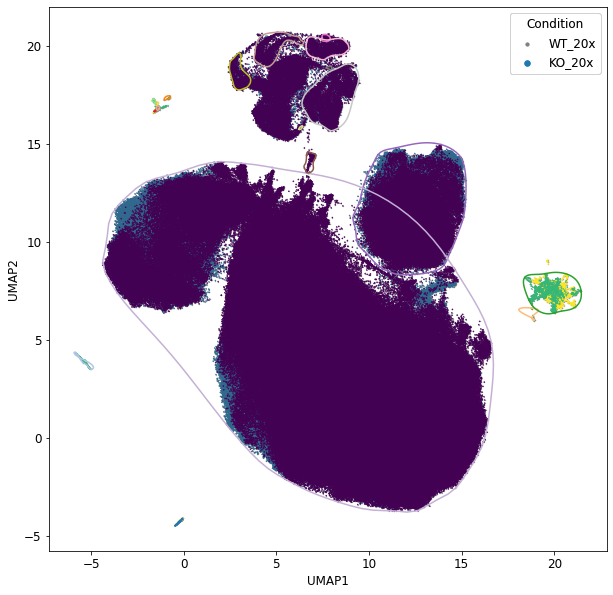

In [4]:
'''
Despite all the conditions being listed at several point in the function, only two are shown in the legend.
'''
plt.rcParams["legend.markerscale"] = 10
cp.draw_cluster_hulls(lab_dr_df,cluster_by='umap', color_by='condition',ax=None,draw_pts=True,save_path=cp.CLUST_PARAMS_DIR+'condition')


In [5]:
factor = 'area'

In [6]:
cp.time_superplot(comb_df, factor)

In [43]:
import plotly.graph_objects as go
import seaborn as sns

def time_superplot_(df, factor,t_window=None, savepath=cp.TIMEPLOT_DIR):

    '''
    Convert a dataframe with a specified parameter into a plot that shows
    that parameter changing over the course of the experiment.

    Input:
        df: DataFrame
        factor: String: column title for the factor to be visualized.

    Returns:
        fig_data: Plotly graph data
    '''

    cond_grouping = 'Condition'
    rep_grouping = 'Replicate_ID'

    if(cp.USE_SHORTLABELS):
        cond_grouping = 'Condition_shortlabel'
        rep_grouping = 'Replicate_shortlabel'

    fig1_data = [] # Define as an empty list to add traces

    # Frames to be calculated ones for the whole set
    n_frames = int(np.max(df['frame']))


    # palette = 'tab10'
    colors = sns.color_palette(cp.PALETTE, n_colors=len(df[cond_grouping].unique()))
    fig_data_list = []

    # Loop for each condition
    for i, cond in enumerate(df[cond_grouping].unique()):


        fac_array = cp.timeavg_mean_error(df[df[cond_grouping]==cond], n_frames,factor,t_window)

        fig1_data = cp.timeplot_sample(fig1_data, factor, fac_array, n_frames,
                       color_rgb = colors[i],label=cond)

#         subfig_data = []

#         # Each replicate from within that condition
#         for rep in df[df[cond_grouping]==cond][rep_grouping].unique():

#             fac_array = cp.timeavg_mean_error(df[(df[cond_grouping]==cond)&(df[rep_grouping]==rep)],
#                                            n_frames,factor,t_window)

#             # Generate a slightly different random hue for each replicate.
#             rand_vect = np.random.normal(0, 0.10, 3) #(mu,sigma)
#             this_color = np.clip(colors[i]+rand_vect, 0,1)
#             this_color = np.around(this_color,decimals=4)
#             # fig2_data used previously when only 2 subplots were included.
# #             fig2_data = timeplot_sample(fig2_data, factor, fac_array, n_frames,
# #                            color_rgb = str(tuple(this_color)), label=rep)
#             subfig_data = cp.timeplot_sample(subfig_data, factor, fac_array, n_frames,
#                            color_rgb = str(tuple(this_color)), label=rep)#,y_range=y_range)

#         fig_data_list.append(subfig_data) #New suplot for each condition

#     fig_data_list = []
    fig_data_list.append(fig1_data)
# #     fig_data_list.append(fig2_data)

#     fig_subplots = make_subplots(
#         rows=len(fig_data_list),
#         cols=1,
# #         shared_xaxes=True,
# #         row_heights=[1,3],

#         # You can define the subplot titles here:
# #         subplot_titles=['Time-averaged per condition', 'Time-averaged per replicate']
#         subplot_titles=list(df[cond_grouping].unique())+['Time-averaged per condition']

#     )

#     for i, subfig in enumerate(fig_data_list):

#         for sub_subfig in subfig:
#             fig_subplots.add_trace(sub_subfig,row=i+1, col=1)

    fig = go.Figure(fig1_data)
            
            
#     fig = go.Figure(fig_subplots)

    fig.update_layout(
            title_text=factor+ " as a function of time",
            autosize=False,
            width=1000,
            height=500,
#             xaxis_title= 'Time (min)',
#             yaxis_title= factor,
                legend=dict(
                orientation="v",
                yanchor="bottom",
                y=0,#-0.4,
                xanchor="left",
                x=1,
                traceorder='normal'
            ))

    # Specify axis labels
    fig['layout']['xaxis']['title']='Time (min)'
#     fig['layout']['xaxis2']['title']='Time (min)'
    fig['layout']['yaxis']['title']= factor
#     fig['layout']['yaxis2']['title']= factor


    if STATIC_PLOTS:
        fig.write_image(savepath+str(factor)+'_timeplot_multi-condition.png')

    if PLOTS_IN_BROWSER:

        fig.show()

    return fig

In [44]:
'''
This version will be modified to only show the final (combined) plot
'''
factor = 'speed'
time_superplot_(comb_df, factor)

In [45]:
cp.timeplots_of_differences(comb_df, factor='speed')

In [88]:
def scatter_subplots(df_in, dr_method='tSNE'):

    '''
    Visualize dimensionally reduced space as a histogram and perfrom image
    collocalization between the images.

    TO DO: Update this to work for the inputted conditions...
    By Default it assumes the first is the control and the second is for comparison.
    '''


    if(dr_method == 'tsne' or dr_method == 'tSNE'):

            x_lab = 'tSNE1'
            y_lab = 'tSNE2'

    elif dr_method == 'PCA':

            x_lab = 'PC1'
            y_lab = 'PC2'

    elif (dr_method == 'umap' or dr_method == 'UMAP'):

            x_lab = 'UMAP1'
            y_lab = 'UMAP2'

    df = df_in.copy()

    # Get the list of conditions included in the dataframe. By default show the first two.
    cond_list = df['Condition_shortlabel'].unique()
    print(cond_list)

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,  figsize=(20,20))

    ax1.title.set_text('Combined set')
    # ax2.title.set_text(CTL_LABEL)
    # ax3.title.set_text(CONDITIONS_TO_INCLUDE[1])
    # ax2.title.set_text(CONDITION_SHORTLABELS[0])
    # ax3.title.set_text(CONDITION_SHORTLABELS[1])
    ax2.title.set_text(cond_list[0])
    ax3.title.set_text(cond_list[1])
    ax4.title.set_text('Combined set with cluster outlines')


    # xy_range = [[-60, 60], [-40, 40]]
    xy_range = [[np.min(df[x_lab]), np.max(df[x_lab])], [np.min(df[y_lab]), np.max(df[y_lab])]]

    ax1.scatter(x=df[x_lab],y=df[y_lab], c=df['label'],s=0.5, alpha=0.5)

    ctl_df = df[df['Condition_shortlabel']==cond_list[0]]#CONDITION_SHORTLABELS[0]]

    ax2.scatter(x=ctl_df[x_lab],y=ctl_df[y_lab], c=ctl_df['label'],s=0.5, alpha=0.5)



    comp_df = df[df['Condition_shortlabel']==cond_list[1]]#CONDITION_SHORTLABELS[1]]

    ax3.scatter(x=comp_df[x_lab],y=comp_df[y_lab], c=comp_df['label'],s=0.5, alpha=0.5)


    
    sns.scatterplot(data=df, hue='Condition_shortlabel', x=x_lab, y=y_lab, ax=ax4, s=0.2, alpha=0.4)
    ax4.legend()
    #         ax.scatter(x=sub_df[x_lab],y=sub_df[y_lab], c=sub_df['Condition_shortlabel'].values(), s=1, alpha=1)
    cp.draw_cluster_hulls(df,cluster_by=dr_method, color_by='condition',ax=ax4,draw_pts=False,save_path=cp.CLUST_PARAMS_DIR+'temp')

#     cp.draw_cluster_hulls(df,cluster_by=dr_method, color_by='condition',ax=ax4,draw_pts=True,save_path=cp.CLUST_PARAMS_DIR+'condition')


    
    if STATIC_PLOTS:

        plt.savefig(DR_DIR +str(dr_method)+'_4panel_scatter_multi-condition.png', format='png', dpi=600)

#     if PLOTS_IN_BROWSER:

#         fig.show()
       
    

    return fig

['WT_20x' 'KO_20x' 'WT_100x' 'KO_100x']


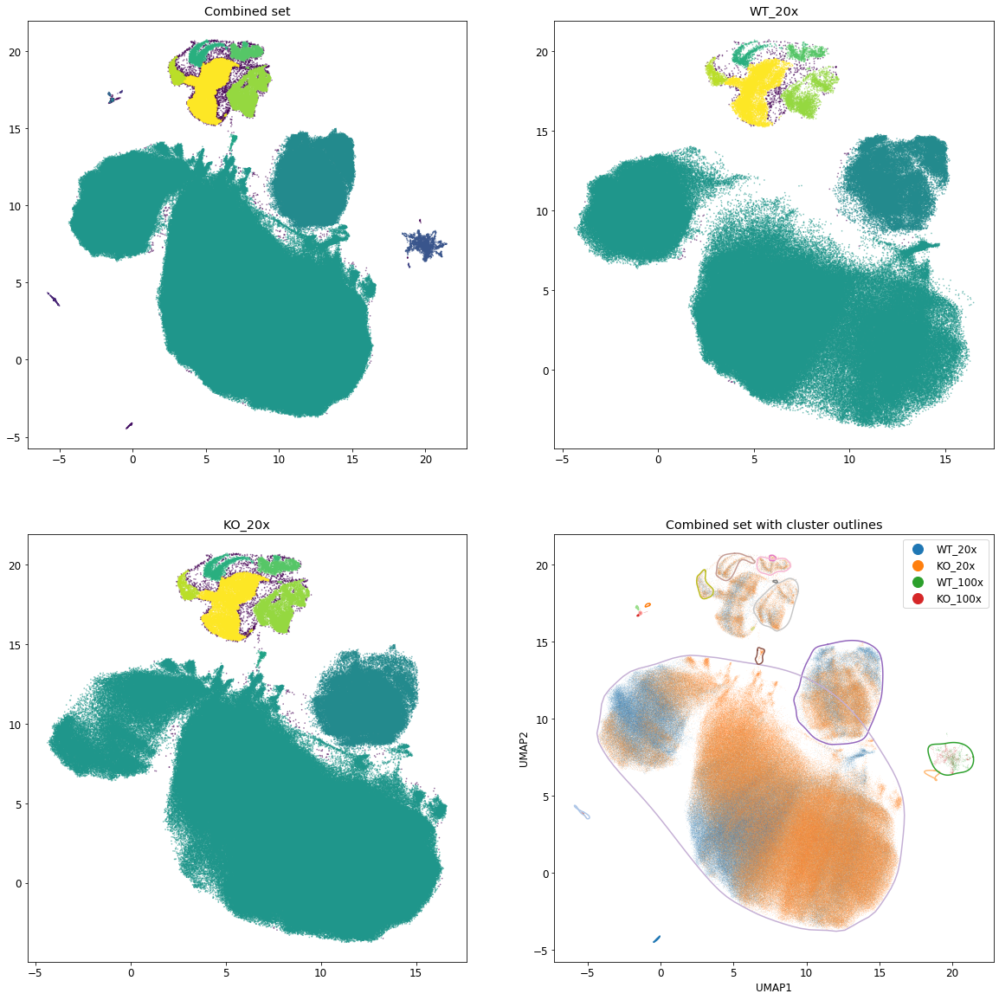

In [89]:
f = scatter_subplots(lab_dr_df, dr_method='umap')

In [ ]:
sub_df_1 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('20x')]
sub_df_2 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('100x')]

dr_method = 'UMAP'
f1 = scatter_subplots(sub_df_1,dr_method=dr_method)
f2 = scatter_subplots(sub_df_2,dr_method=dr_method)
# f1=vis.spatial_img_coloc(sub_df_1, xy=xy,thresh=20,n_bins=100)
# f2=vis.spatial_img_coloc(sub_df_2, xy=xy,thresh=20,n_bins=100)

In [ ]:
sub_df_1 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('WT')]
sub_df_2 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('KO')]

xy = 'UMAP'
f1 = scatter_subplots(sub_df_1,dr_method=dr_method)
f2 = scatter_subplots(sub_df_2,dr_method=dr_method)

In [ ]:
# plt.scatter(x=lab_dr_df['UMAP1'],y=lab_dr_df['UMAP2'], c=lab_dr_df['label'], s=0.1, alpha=0.2)

#figsize=(50,50)

In [ ]:
# fig, ax = plt.subplots()
# ax.scatter(x=lab_dr_df['UMAP1'],y=lab_dr_df['UMAP2'], c=lab_dr_df['label'], s=0.1, alpha=0.2)
# cp.draw_cluster_hulls(lab_dr_df,cluster_by='umap', color_by='condition',ax=ax,draw_pts=False,save_path=cp.CLUST_PARAMS_DIR+'condition')



In [ ]:
# # Make a version of the above plot that prints frames and animates them.
# for frame in lab_dr_df['frame'].unique():
    
#     print(frame)
#     sub_df = lab_dr_df[lab_dr_df['frame'] == frame]
#     print(len(sub_df))

    
#     # Create the plot.
    
    
    
#     plt.savefig
    
    
#     fig.write_image(DR_DIR+str(dr_method)+'_4panel_scatter_multi-condition.png')


In [53]:
TEMP_OUTPUT

'D://Michael_Shannon/CELLPLATO2022_TESTING/20x_100x_high_temp_res_July20OUTPUT/CellPlatoFigure_20x100x_July20\\2022-07-26_13-54-16-105129\\tmp/'

In [ ]:
def multi_conditon_scatter(dr_df, dr_method = 'umap'):




    if(dr_method == 'tsne' or dr_method == 'tSNE'):

        x_lab = 'tSNE1'
        y_lab = 'tSNE2'

    elif dr_method == 'PCA':

        x_lab = 'PC1'
        y_lab = 'PC2'

    elif (dr_method == 'umap' or dr_method == 'UMAP'):

        x_lab = 'UMAP1'
        y_lab = 'UMAP2'



    fig, ax = plt.subplots()

    sns.scatterplot(data=lab_dr_df, hue='Condition_shortlabel', x=x_lab, y=y_lab, ax=ax, s=0.2, alpha=0.4)
    ax.legend()
    #         ax.scatter(x=sub_df[x_lab],y=sub_df[y_lab], c=sub_df['Condition_shortlabel'].values(), s=1, alpha=1)
    cp.draw_cluster_hulls(lab_dr_df,cluster_by=dr_method, color_by='condition',ax=ax,draw_pts=False,save_path=cp.CLUST_PARAMS_DIR+'temp')

    ax.set_title(dr_method+ ' embedding', fontsize=18)
    ax.set_xlabel(x_lab)
    ax.set_ylabel(y_lab)

    fig.savefig(DR_DIR+dr_method+'multi-conditon_scatter', dpi=300)
    
    
multi_conditon_scatter(dr_df, dr_method)

In [ ]:
import imageio
from IPython.display import Image
plt.rcParams["legend.markerscale"] = 2

def animate_t_lowd(dr_df, dr_method='tSNE'):

    '''
    Create an animated gif to show the cell_df's measurements through physical and
    low dimensional space.
    Saves temporary files to TMP folder,
    '''
    
    
    
    if(dr_method == 'tsne' or dr_method == 'tSNE'):

            x_lab = 'tSNE1'
            y_lab = 'tSNE2'

    elif dr_method == 'PCA':

            x_lab = 'PC1'
            y_lab = 'PC2'

    elif (dr_method == 'umap' or dr_method == 'UMAP'):

            x_lab = 'UMAP1'
            y_lab = 'UMAP2'

            

    x_bounds = (np.min(dr_df[x_lab])-10, np.max(dr_df[x_lab])+10)
    y_bounds = (np.min(dr_df[y_lab])-10, np.max(dr_df[y_lab])+10)       
            
    frames =  dr_df['frame'].unique()
    filenames=[]


    for frame in frames:

        sub_df = lab_dr_df[lab_dr_df['frame'] == frame]
        filename = dr_method +'_frame_'+str(frame)+'.png'

        fig, ax = plt.subplots()
    
        sns.scatterplot(data=sub_df, hue='Condition_shortlabel', x=x_lab, y=y_lab, ax=ax)
        ax.legend()
#         ax.scatter(x=sub_df[x_lab],y=sub_df[y_lab], c=sub_df['Condition_shortlabel'].values(), s=1, alpha=1)
        cp.draw_cluster_hulls(sub_df,cluster_by=dr_method, color_by='condition',ax=ax,draw_pts=False,save_path=cp.CLUST_PARAMS_DIR+'temp')
        
        ax.set_xlim(x_bounds)
        ax.set_ylim(y_bounds)
        ax.set_title(dr_method+ ' embedding t =  '+str(int(frame * SAMPLING_INTERVAL)) + ' min', fontsize=18)
#         ax.scatter(x=dr_df['UMAP1'],y=dr_df['UMAP2'], s=2, c=pc_colors)
        ax.set_xlabel(x_lab)
        ax.set_ylabel(y_lab)
        
        fig.savefig(TEMP_OUTPUT+filename, dpi=300)
        plt.clf()
        filenames.append(TEMP_OUTPUT+filename)

    # Build the gif
    animation_filename = ANIM_OUTPUT + dr_method+'_anim.gif'
    with imageio.get_writer(animation_filename, mode='I',fps=5) as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)

    # Remove files
#     for filename in set(filenames):
#         os.remove(filename)

    display(Image(data=open(animation_filename,'rb').read(), format='png'))
    
animate_t_lowd(dr_df, dr_method='umap')

In [ ]:
animate_t_lowd(dr_df, dr_method='tSNE')